## Overview

This notebook includes simple data cleaning as well as modeling results. We begin our analysis with visual exploratory data anlysis, then we turn to SQL to gain a deeper understanding of our data. Next, we fit two linear regression models to predict Price and compare their results. Finally, we fit two logistic regression results to classify whether a host is a superhost and compare their results.

In [0]:
# File location and type
file_location = "/FileStore/tables/airbnb_clean.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
airbnb = spark.read.format(file_type) \
  .option("escape",';') \
  .option("inferSchema", infer_schema) \
  .option("multiLine","true") \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(airbnb)

listing_id,Name,Host ID,Host Name,Host Response Rate,Host Is Superhost,Host total listings count,City,Neighbourhood cleansed,State,Country,Property type,Room type,Accommodates,Bathrooms,Bedrooms,Amenities,Price,Number of reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per month,id,date,reviewer_id,reviewer_name,comments
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1.0,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,1107,2009-03-27,9193,Holly,Stephanie's offered all the most important things: a warm welcome into a comfortable home; a comfortable bed in a quiet room; fresh & clean towels & blankets; and easy access to Manhattan. Finding myself travelling to NYC in the future I feel I already have a open invitation to make home away from home through Stephanie's generousity.
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1.0,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,7350,2009-08-13,26718,Greg,awesome couldn't have been better.
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1.0,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,137500,2010-11-12,185050,Gerry,"""We stayed at the 111th Street apartment with Stephanie and her family. As an alternative to staying in an """"Overpriced"""" New York tourist hotel"
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1.0,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allow

In [0]:
airbnb.dtypes

Out[2]: [('listing_id', 'string'),
 ('Name', 'string'),
 ('Host ID', 'string'),
 ('Host Name', 'string'),
 ('Host Response Rate', 'string'),
 ('Host Is Superhost', 'string'),
 ('Host total listings count', 'string'),
 ('City', 'string'),
 ('Neighbourhood cleansed', 'string'),
 ('State', 'string'),
 ('Country', 'string'),
 ('Property type', 'string'),
 ('Room type', 'string'),
 ('Accommodates', 'string'),
 ('Bathrooms', 'string'),
 ('Bedrooms', 'string'),
 ('Amenities', 'string'),
 ('Price', 'string'),
 ('Number of reviews', 'string'),
 ('Review Scores Rating', 'string'),
 ('Review Scores Accuracy', 'string'),
 ('Review Scores Cleanliness', 'string'),
 ('Review Scores Checkin', 'string'),
 ('Review Scores Communication', 'string'),
 ('Review Scores Location', 'string'),
 ('Review Scores Value', 'string'),
 ('Reviews per month', 'string'),
 ('id', 'string'),
 ('date', 'string'),
 ('reviewer_id', 'string'),
 ('reviewer_name', 'string'),
 ('comments', 'string')]

In [0]:
from pyspark.sql.functions import col, substring, length, expr

airbnb = airbnb.withColumn('Host Response Rate',col('Host Response Rate').cast('double'))\
      .withColumn('Host total listings count',col('Host total listings count').cast('double'))\
      .withColumn('Accommodates',col('Accommodates').cast('integer'))\
      .withColumn('Bathrooms', col('Bathrooms').cast('double'))\
      .withColumn('Bedrooms', col('Bedrooms').cast('double'))\
      .withColumn('Price', col('Price').cast('integer'))\
      .withColumn('Number of reviews', col('Number of reviews').cast('integer'))\
      .withColumn('Review Scores Rating', col('Review Scores Rating').cast('integer'))\
      .withColumn('Review Scores Accuracy', col('Review Scores Accuracy').cast('integer'))\
      .withColumn('Review Scores Cleanliness', col('Review Scores Cleanliness').cast('integer'))\
      .withColumn('Review Scores Checkin', col('Review Scores Checkin').cast('integer'))\
      .withColumn('Review Scores Communication', col('Review Scores Communication').cast('integer'))\
      .withColumn('Review Scores Location', col('Review Scores Location').cast('integer'))\
      .withColumn('Review Scores Value', col('Review Scores Value').cast('integer'))\
      .withColumn('Reviews per month', col('Reviews per month').cast('double'))
  
    
airbnb.printSchema()

root
-- listing_id: string (nullable = true)
-- Name: string (nullable = true)
-- Host ID: string (nullable = true)
-- Host Name: string (nullable = true)
-- Host Response Rate: double (nullable = true)
-- Host Is Superhost: string (nullable = true)
-- Host total listings count: double (nullable = true)
-- City: string (nullable = true)
-- Neighbourhood cleansed: string (nullable = true)
-- State: string (nullable = true)
-- Country: string (nullable = true)
-- Property type: string (nullable = true)
-- Room type: string (nullable = true)
-- Accommodates: integer (nullable = true)
-- Bathrooms: double (nullable = true)
-- Bedrooms: double (nullable = true)
-- Amenities: string (nullable = true)
-- Price: integer (nullable = true)
-- Number of reviews: integer (nullable = true)
-- Review Scores Rating: integer (nullable = true)
-- Review Scores Accuracy: integer (nullable = true)
-- Review Scores Cleanliness: integer (nullable = true)
-- Review Scores Checkin: integer (nullable = true)
-- Review Scores Communication: integer (nullable = true)
-- Review Scores Location: integer (nullable = true)
-- Review Scores Value: integer (nullable = true)
-- Reviews per month: double (nullable = true)
-- id: string (nullable = true)
-- date: string (nullable = true)
-- reviewer_id: string (nullable = true)
-- reviewer_name: string (nullable = true)
-- comments: string (nullable = true)

In [0]:
airbnb.count()

Out[4]: 963440

In [0]:
#Check for nulll values
from pyspark.sql.functions import when, count, col
airbnb.select([count(when(col(c).isNull(), c)).alias(c) for c in 
           airbnb.columns]).toPandas().T

Out[3]:

,0
listing_id,0
Name,13660
Host ID,17592
Host Name,19710
Host Response Rate,22493
Host Is Superhost,21544
Host total listings count,22493
City,22134
Neighbourhood cleansed,22263
State,22353


In [0]:
#Remove null values
airbnb2 = airbnb.dropna()

In [0]:
#No more null values in our data!
airbnb2.select([count(when(col(c).isNull(), c)).alias(c) for c in 
           airbnb2.columns]).toPandas().T

Out[7]:

,0
listing_id,0
Name,0
Host ID,0
Host Name,0
Host Response Rate,0
Host Is Superhost,0
Host total listings count,0
City,0
Neighbourhood cleansed,0
State,0


In [0]:
airbnb2.count()

Out[8]: 940947

## Plots

In [0]:
#Convert data into Pandas DataFrame to create plots using Seaborn
import pandas as pd
import seaborn as sns
airbnb_pd = airbnb2.toPandas()


In [0]:
#Review Scores Rating should range from 0 to 100 so remove value of 38,425
airbnb_pd.drop(airbnb_pd.loc[airbnb_pd['Review Scores Rating'] == 38425].index, inplace=True)


In [0]:
#CA, Ca, ca should all be the same so we capitalize State
airbnb_pd['State'] = airbnb_pd['State'].str.upper()

Out[69]:

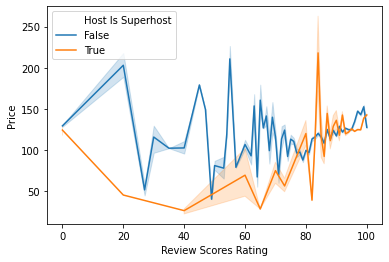

<matplotlib.axes._subplots.AxesSubplot at 0x7f4e57b5ad30>

In [0]:
#Review rating vs Price grouped by whether the host is a superhost
sns.lineplot(x="Review Scores Rating", y="Price", hue ="Host Is Superhost", data=airbnb_pd)

Out[64]:

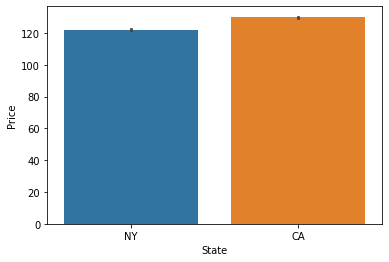

<matplotlib.axes._subplots.AxesSubplot at 0x7f4e57b09ee0>

In [0]:
#Average Price in NY and CA
sns.barplot(x="State", y="Price", data=airbnb_pd)

Out[73]:

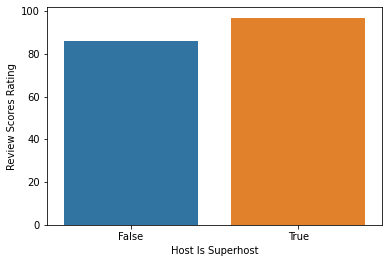

<matplotlib.axes._subplots.AxesSubplot at 0x7f4e57cade80>

In [0]:
#Rating based on Host Status
sns.barplot(x="Host Is Superhost", y="Review Scores Rating", data = airbnb_pd)

## SQL

In [0]:
# Enable Arrow-based columnar data transfers
spark.conf.set("spark.sql.execution.arrow.enabled", "true")
airbnb_spark = spark.createDataFrame(airbnb_pd)

In [0]:
# Create a view or table

temp_table_name = "airbnb"

airbnb_spark.createOrReplaceTempView(temp_table_name)

In [0]:
%sql

/* Superhosts have higher ratings than normal hosts */

select `Host is Superhost`, ROUND(AVG(`Review Scores Rating`),2) as Rating from airbnb
GROUP BY  `Host is Superhost`
ORDER BY Rating DESC;

Host is Superhost,Rating
True,96.87
False,86.1


In [0]:
%sql

/* More non-Superhosts than superhosts on airbnb */

select `Host is Superhost`, count(*) as Rating from airbnb
GROUP BY  `Host is Superhost`
ORDER BY Rating DESC;

Host is Superhost,Rating
False,631114
True,309832


In [0]:
%sql

/* Listing out the top hosts */

select `Host ID`, `Host Name`, `Host is Superhost`, AVG(`Review Scores Rating`) as Rating from airbnb
GROUP BY `Host ID`, `Host Name`, `Host is Superhost`
ORDER BY Rating DESC;


Host ID,Host Name,Host is Superhost,Rating
3936154,Molly,False,100.0
22681989,Veronica,False,100.0
63588,Dimitri,True,100.0
1311398,Ben,False,100.0
24913451,Cristal,False,100.0
39641684,Jenna,False,100.0
2052364,Melissa,False,100.0
31940444,Dami,False,100.0
24840854,Robert,False,100.0
3410620,Lee,False,100.0


In [0]:
%sql

/* Most expensive neighbourhoods */
select `Neighbourhood cleansed` as Neighborhood, State, ROUND(AVG(Price),2) as Price from airbnb
GROUP BY Neighborhood, State
ORDER BY Price DESC, Neighborhood
LIMIT 10;


Neighborhood,State,Price
Vermont-Slauson,CA,568.24
Mill Basin,NY,500.0
Unincorporated Santa Susana Mountains,CA,466.0
Avalon,CA,368.87
Flatiron District,NY,346.05
Bel-Air,CA,342.08
Fieldston,NY,339.13
Green Valley,CA,316.25
Mission Hills,CA,295.0
Beverly Crest,CA,276.03


In [0]:
%sql

/* Most expensive cities */
select City, State, ROUND(AVG(Price),2) as Price from airbnb
GROUP BY City, State
ORDER BY Price DESC, City;

City,State,Price
Manhattan,NY,176.82
Los Angeles,CA,130.02
Brooklyn,NY,113.45
Bronx,NY,73.25


In [0]:
%sql

/* Price by Room Type */
SELECT DISTINCT `Room Type`, ROUND(AVG(Price),2) as Price FROM airbnb
GROUP BY `Room Type`
ORDER BY Price DESC;

Room Type,Price
Entire home/apt,166.27
Private room,74.96
Shared room,41.17


In [0]:
%sql

/* Price by number of guests accomodated */
SELECT DISTINCT Accommodates, ROUND(AVG(Price),2) as Price FROM airbnb
GROUP BY Accommodates
ORDER BY Accommodates;

Accommodates,Price
1,64.22
2,94.72
3,115.1
4,146.08
5,172.09
6,209.55
7,242.07
8,279.41
9,257.25
10,318.25


In [0]:
%sql

/* Price by number of bathrooms */
SELECT Bathrooms, ROUND(AVG(Price),2) as Price FROM airbnb
WHERE Bathrooms != 0
GROUP BY Bathrooms
ORDER BY Bathrooms;

Bathrooms,Price
0.5,89.76
1.0,111.75
1.5,115.96
2.0,191.73
2.5,263.82
3.0,258.03
3.5,441.61
4.0,187.51
4.5,419.2
5.0,427.61


In [0]:
%sql

/* Price by number of bedrooms */
SELECT Bedrooms, ROUND(AVG(Price),2) as Price FROM airbnb
WHERE Bedrooms != 14
GROUP BY Bedrooms
ORDER BY Bedrooms;

Bedrooms,Price
1.0,99.83
2.0,191.83
3.0,281.19
4.0,373.55
5.0,395.16
6.0,399.02
7.0,454.92
8.0,421.27
9.0,360.6
10.0,472.44


## Correlation with Price

In [0]:
airbnb_pd.dtypes

Out[82]: listing_id object
Name object
Host ID object
Host Name object
Host Response Rate float64
Host Is Superhost object
Host total listings count float64
City object
Neighbourhood cleansed object
State object
Country object
Property type object
Room type object
Accommodates int32
Bathrooms float64
Bedrooms float64
Amenities object
Price int32
Number of reviews int32
Review Scores Rating int32
Review Scores Accuracy int32
Review Scores Cleanliness int32
Review Scores Checkin int32
Review Scores Communication int32
Review Scores Location int32
Review Scores Value int32
Reviews per month float64
id object
date object
reviewer_id object
reviewer_name object
comments object
dtype: object

In [0]:
#Select only numerical features
airbnb_num = airbnb_pd.select_dtypes(include = ['int32', 'float64'])
airbnb_num

Out[85]:

,Host Response Rate,Host total listings count,Accommodates,Bathrooms,Bedrooms,Price,Number of reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per month
0,1.0,4.0,1,1.0,1.0,43,66,96,10,9,10,10,9,10,1.77
1,1.0,4.0,1,1.0,1.0,43,66,96,10,9,10,10,9,10,1.77
2,1.0,4.0,1,1.0,1.0,43,66,96,10,9,10,10,9,10,1.77
3,1.0,4.0,1,1.0,1.0,43,66,96,10,9,10,10,9,10,1.77
4,1.0,4.0,1,1.0,1.0,43,66,96,10,9,10,10,9,10,1.77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
940942,1.0,3.0,10,3.0,4.0,450,5,90,10,9,10,10,10,10,0.38
940943,1.0,3.0,10,3.0,4.0,450,5,90,10,9,10,10,10,10,0.38
940944,1.0,3.0,10,3.0,4.0,450,5,90,10,9,10,10,10,10,0.38
940945,1.0,3.0,10,3.0,4.0,450,5,90,10,9,10,10,10,10,0.38


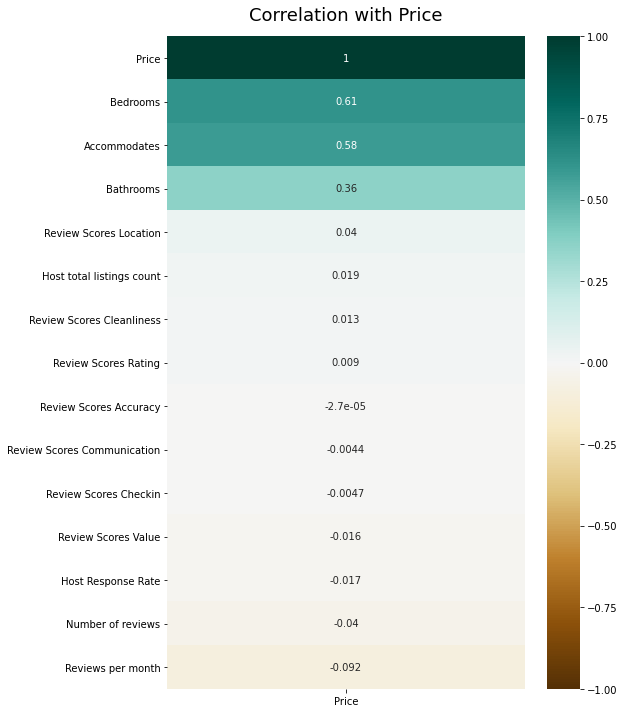

In [0]:
#One-way correlation plot with Price vs all numerical variables
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 12))

heatmap = sns.heatmap(airbnb_num.corr()[['Price']].sort_values(by='Price', ascending=False), vmin = -1, vmax = 1, annot = True, cmap = 'BrBG')

heatmap.set_title('Correlation with Price', fontdict={'fontsize':18}, pad=16);

## Linear Regression without Amenities

Linear regression using Bedrooms, AAccomodates, Bathrooms, Host is Superhost, City, State, and Room Type.

In [0]:
# ### Categorical columns
 
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml import Pipeline
import pyspark.sql.functions as F
 
# categorical columns

categorical = airbnb_spark.select('Host Is Superhost', 'City', 'State', 'Room type')

categorical_columns = categorical.columns[0:4]

stage_string = [StringIndexer(inputCol= c, outputCol= c+"_string_encoded") for c in categorical_columns]

stage_one_hot = [OneHotEncoder(inputCol= c+"_string_encoded", outputCol= c+ "_one_hot") for c in categorical_columns]

ppl = Pipeline(stages=stage_string +stage_one_hot)
reg_data = ppl.fit(airbnb_spark).transform(airbnb_spark)
display(reg_data)

listing_id,Name,Host ID,Host Name,Host Response Rate,Host Is Superhost,Host total listings count,City,Neighbourhood cleansed,State,Country,Property type,Room type,Accommodates,Bathrooms,Bedrooms,Amenities,Price,Number of reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per month,id,date,reviewer_id,reviewer_name,comments,Host Is Superhost_string_encoded,City_string_encoded,State_string_encoded,Room type_string_encoded,Host Is Superhost_one_hot,City_one_hot,State_one_hot,Room type_one_hot
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,1107,2009-03-27,9193,Holly,Stephanie's offered all the most important things: a warm welcome into a comfortable home; a comfortable bed in a quiet room; fresh & clean towels & blankets; and easy access to Manhattan. Finding myself travelling to NYC in the future I feel I already have a open invitation to make home away from home through Stephanie's generousity.,0.0,3.0,1.0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,7350,2009-08-13,26718,Greg,awesome couldn't have been better.,0.0,3.0,1.0,1.0,"Map(vectorType -> sparse, length -> 1, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 3, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 1, indices -> List(), values -> List())","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,137500,2010-11-12,185050,Gerry,"""We s

In [0]:
assembler = VectorAssembler(
  inputCols = ['Bedrooms', 'Accommodates', 'Bathrooms', 'Host Is Superhost_one_hot', 'City_one_hot', 'State_one_hot', 'Room type_one_hot'],
  outputCol = 'features')

data_linreg = assembler.transform(reg_data)
data_linreg = data_linreg.withColumn('label', F.col('Price'))
data_linreg.select('features', 'label').show()

+--------------------+-----+
 features|label|
+--------------------+-----+
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
(10,[0,1,2,3,9],[...| 43|
+--------------------+-----+
only showing top 20 rows

In [0]:
# ## Split data into training and test datasets
training, test = data_linreg.randomSplit([0.8, 0.2], seed=1234)

In [0]:
from pyspark.ml.regression import LinearRegression
lr = LinearRegression(featuresCol = 'features', labelCol = 'label')
lr_model = lr.fit(training)

In [0]:
pred_training_cv = lr_model.transform(training)
pred_training_cv.show(5, truncate=False)

+----------+--------------+--------+---------+------------------+-----------------+-------------------------+-----+----------------------+-----+-------------+-------------+------------+------------+---------+--------+-----------------------------------------------------------------------------------------------------------------+-----+-----------------+--------------------+----------------------+-------------------------+---------------------+---------------------------+----------------------+-------------------+-----------------+---------+----------+-----------+-------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+--------------------------------+-------------------+--------------------+------------------------+-------------------------+------------+-------------+-----------------+--------------------------------------+-----+-----------------+
listing_id|Name |Host ID |Host Name|Host Response Rate|Host Is Superhost|Host total listings count|City |Neighbourhood cleansed|State|Country |Property type|Room type |Accommodates|Bathrooms|Bedrooms|Amenities |Price|Number of reviews|Review Scores Rating|Review Scores Accuracy|Review Scores Cleanliness|Review Scores Checkin|Review Scores Communication|Review Scores Location|Review Scores Value|Reviews per month|id |date |reviewer_id|reviewer_name|comments |Host Is Superhost_string_encoded|City_string_encoded|State_string_encoded|Room type_string_encoded|Host Is Superhost_one_hot|City_one_hot|State_one_hot|Room type_one_hot|features |label|prediction |
+----------+--------------+--------+---------+------------------+-----------------+-------------------------+-----+----------------------+-----+-------------+-------------+------------+------------+---------+--------+-----------------------------------------------------------------------------------------------------------------+-----+-----------------+--------------------+----------------------+-------------------------+---------------------+---------------------------+----------------------+-------------------+-----------------+---------+----------+-----------+-------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [0]:
# Make Prediction
 
pred = lr_model.transform(test)
display(pred.select('features', 'label', 'prediction'))

features,label,prediction
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373
"Map(vectorType -> sparse, length -> 10, indices -> List(0, 1, 2, 3, 9), values -> List(1.0, 3.0, 1.0, 1.0, 1.0))",60,54.70298199028373


In [0]:
# Module evaluation
# R Squared
from pyspark.ml.evaluation import RegressionEvaluator 
evaluator = RegressionEvaluator(predictionCol='prediction', labelCol='label')
print("The R-square for the training set is {}".format(evaluator.setMetricName('r2').evaluate(pred_training_cv)))
print("The R-square for the test set is {}".format(evaluator.setMetricName('r2').evaluate(pred)))


The R-square for the training set is 0.5050374393354613
The R-square for the test set is 0.5041413309522091

## Linear Regression with Amenities

Linear regression using Bedrooms, AAccomodates, Bathrooms, Host is Superhost, City, State Room Type, and Amenities.

In [0]:
# ### Categorical columns
 
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml import Pipeline
import pyspark.sql.functions as F
from pyspark.ml.feature import Tokenizer, StopWordsRemover, CountVectorizer, IDF, StringIndexer, VectorAssembler

#tokenizer takes text and converts it into 'tokens' or individual words
tokenizer = Tokenizer(inputCol="Amenities", outputCol="token_amenities")
#remove stopwords
stopremove = StopWordsRemover(inputCol='token_amenities',outputCol='stop_tokens')
#convert into bag of words format and get how many times each word appeared in a given message
count_vec = CountVectorizer(inputCol='stop_tokens',outputCol='bag_of_words')
idf = IDF(inputCol="bag_of_words", outputCol="tf_idf")

ppl2 = Pipeline(stages=[tokenizer,stopremove,count_vec,idf])
reg_data2 = ppl2.fit(airbnb_spark).transform(airbnb_spark)
display(reg_data2)

listing_id,Name,Host ID,Host Name,Host Response Rate,Host Is Superhost,Host total listings count,City,Neighbourhood cleansed,State,Country,Property type,Room type,Accommodates,Bathrooms,Bedrooms,Amenities,Price,Number of reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per month,id,date,reviewer_id,reviewer_name,comments,token_amenities,stop_tokens,bag_of_words,tf_idf
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,1107,2009-03-27,9193,Holly,Stephanie's offered all the most important things: a warm welcome into a comfortable home; a comfortable bed in a quiet room; fresh & clean towels & blankets; and easy access to Manhattan. Finding myself travelling to NYC in the future I feel I already have a open invitation to make home away from home through Stephanie's generousity.,"List(cable, tv;internet;wireless, internet;kitchen;free, parking, on, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, on, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, and, blankets;microwave;refrigerator;dishes, and, silverware;cooking, basics;stove;garden, or, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, before, checkout)","List(cable, tv;internet;wireless, internet;kitchen;free, parking, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, blankets;microwave;refrigerator;dishes, silverware;cooking, basics;stove;garden, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, checkout)","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(0.35995498186203967, 0.3713801410310474, 0.4354824259681446, 1.9124806765082059, 0.558077034467884, 0.6885105009864626, 0.7430270537866681, 0.7585315196011062, 0.7812382271416117, 1.3384949260167893, 1.3743850755278975, 1.586120755777393, 1.7702578090085244, 1.8001060442059942, 2.382128782667256, 2.4331435137131523, 2.468265973399554, 3.264729914746733, 3.3690370817553648, 3.513932585872853, 3.5325553662981095, 3.5504205174382166, 3.599073740175804, 3.6027331828861

In [0]:
# ### Categorical columns
 
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml import Pipeline
import pyspark.sql.functions as F
 
# categorical columns

categorical = airbnb_spark.select('Host Is Superhost', 'City', 'State', 'Room type')

categorical_columns = categorical.columns[0:4]

stage_string = [StringIndexer(inputCol= c, outputCol= c+"_string_encoded") for c in categorical_columns]

stage_one_hot = [OneHotEncoder(inputCol= c+"_string_encoded", outputCol= c+ "_one_hot") for c in categorical_columns]

ppl = Pipeline(stages=stage_string +stage_one_hot)
reg_data2 = ppl.fit(reg_data2).transform(reg_data2)
display(reg_data2)

listing_id,Name,Host ID,Host Name,Host Response Rate,Host Is Superhost,Host total listings count,City,Neighbourhood cleansed,State,Country,Property type,Room type,Accommodates,Bathrooms,Bedrooms,Amenities,Price,Number of reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per month,id,date,reviewer_id,reviewer_name,comments,token_amenities,stop_tokens,bag_of_words,tf_idf,Host Is Superhost_string_encoded,City_string_encoded,State_string_encoded,Room type_string_encoded,Host Is Superhost_one_hot,City_one_hot,State_one_hot,Room type_one_hot
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,1107,2009-03-27,9193,Holly,Stephanie's offered all the most important things: a warm welcome into a comfortable home; a comfortable bed in a quiet room; fresh & clean towels & blankets; and easy access to Manhattan. Finding myself travelling to NYC in the future I feel I already have a open invitation to make home away from home through Stephanie's generousity.,"List(cable, tv;internet;wireless, internet;kitchen;free, parking, on, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, on, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, and, blankets;microwave;refrigerator;dishes, and, silverware;cooking, basics;stove;garden, or, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, before, checkout)","List(cable, tv;internet;wireless, internet;kitchen;free, parking, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, blankets;microwave;refrigerator;dishes, silverware;cooking, basics;stove;garden, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, checkout)","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(0.35995498186203967, 0.3713801410310474, 0.4354824259681446, 1.9124806765082059, 0.558077034467884, 0.6885105009864626, 0.7430270537866681, 0.7585315196011062, 0.7812382271416117, 1.3384949260167893, 1.3743850755278975, 1.586120755777393, 1.7702578090085244, 1.8001060442059942, 2.382128782667256, 2

In [0]:
assembler = VectorAssembler(
  inputCols = ['Bedrooms', 'Accommodates', 'Bathrooms', 'Host Is Superhost_one_hot', 'City_one_hot', 'State_one_hot', 'Room type_one_hot','tf_idf'],
  outputCol = 'features')

data_linreg2 = assembler.transform(reg_data2)
data_linreg2 = data_linreg2.withColumn('label', F.col('Price'))
data_linreg2.select('features', 'label').show()

+--------------------+-----+
 features|label|
+--------------------+-----+
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
(4630,[0,1,2,3,9,...| 43|
+--------------------+-----+
only showing top 20 rows

In [0]:
# ## Split data into training and test datasets
training, test = data_linreg2.randomSplit([0.8, 0.2], seed=1234)

In [0]:
from pyspark.ml.regression import LinearRegression
lr2 = LinearRegression(featuresCol = 'features', labelCol = 'label')
lr_model2 = lr2.fit(training)

In [0]:
pred_training_cv2 = lr_model2.transform(training)
pred_training_cv2.show(5, truncate=False)

+----------+--------------+--------+---------+------------------+-----------------+-------------------------+-----+----------------------+-----+-------------+-------------+------------+------------+---------+--------+-----------------------------------------------------------------------------------------------------------------+-----+-----------------+--------------------+----------------------+-------------------------+---------------------+---------------------------+----------------------+-------------------+-----------------+---------+----------+-----------+-------------+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+--------------------------------------------------------------------------------------------------------------------------+----------------------------------------------------------------------------------------------------------------------+------------------------------------------------------------+-------------------------------------------------------------------------------------------------------------------------------------------------------------------+--------------------------------+-------------------+--------------------+------------------------+-------------------------+------------+-------------+-----------------+---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+-----+-----------------+
listing_id|Name |Host ID |Host Name|Host Response Rate|Host Is Superhost|Host total listings count|City |Neighbourhood cleansed|State|Country |Property type|Room type |Accommodates|Bathrooms|Bedrooms|Amenities |Price|Number of reviews|Review Scores Rating|Review Scores Accuracy|Review Scores Cleanliness|Review Scores Checkin|Review Scores Communication|Review Scores Location|Review Scores Value|Reviews per month|id |date |reviewer_id|reviewer_name|comments |token_amenities |stop_tokens |bag_of_words |tf_idf |Host Is Superhost_string_encoded|City_string_encoded|State_string_encoded|Room type_string_encoded|Host Is Superhost_one_hot|City_one_hot|State_one_hot|Room type_one_hot|features |label|prediction |
+----------+--------------+--------+---------+------------------+-----------------+-------------------------+-----+----------------------+-----+-------------+-------------+------------+------------+---------+--------+-----------------------------------------------------------------------------------------------------------------+-----+-----------------+--------------------+----------------------+-------------------------+---------------------+---------------------------+----------------------+-------------------+-----------------+---------+----------+-----------+-------------+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------

In [0]:
# Make Prediction
 
pred2 = lr_model2.transform(test)
display(pred2.select('features', 'label', 'prediction'))

features,label,prediction
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915
"Map(vectorType -> sparse, length -> 4630, indices -> List(0, 1, 2, 3, 9, 11, 12, 28, 49, 123, 156, 347), values -> List(1.0, 3.0, 1.0, 1.0, 1.0, 0.35995498186203967, 0.3713801410310474, 1.586120755777393, 2.6625796792387724, 4.2665942306399804, 4.688056625589695, 6.100198867450628))",60,44.60106776247915


In [0]:
# Module evaluation
# R Squared
from pyspark.ml.evaluation import RegressionEvaluator 
evaluator2 = RegressionEvaluator(predictionCol='prediction', labelCol='label')
print("The R-square for the training set is {}".format(evaluator2.setMetricName('r2').evaluate(pred_training_cv2)))
print("The R-square for the test set is {}".format(evaluator2.setMetricName('r2').evaluate(pred2)))


The R-square for the training set is 0.6142196708955706
The R-square for the test set is 0.6099717939048036

## Logistic Regression without Amenities

Logistic regression using Bedrooms, AAccomodates, Bathrooms, Price, City, State, and Room Type.

In [0]:
assembler = VectorAssembler(
  inputCols = ['Bedrooms', 'Accommodates', 'Bathrooms', 'Price', 'City_one_hot', 'State_one_hot', 'Room type_one_hot'],
  outputCol = 'features')

data_logreg = assembler.transform(reg_data)
data_logreg = data_logreg.withColumn('label', F.col('Host Is Superhost_string_encoded'))
data_logreg.select('features', 'label').show()

+--------------------+-----+
 features|label|
+--------------------+-----+
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
(10,[0,1,2,3,9],[...| 0.0|
+--------------------+-----+
only showing top 20 rows

In [0]:
# ## Split data into training and test datasets
training, test = data_logreg.randomSplit([0.8, 0.2], seed=1234)

In [0]:
# Build Logistic Regression Model
from pyspark.ml.classification import LogisticRegression
log_reg = LogisticRegression(featuresCol='features', labelCol='label')
logr_model = log_reg.fit(training)

In [0]:
# Make Prediction
 
results = logr_model.transform(test)
results.select('label','prediction').show()

+-----+----------+
label|prediction|
+-----+----------+
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
+-----+----------+
only showing top 20 rows

In [0]:
# #### Confusion Matrix
from sklearn.metrics import confusion_matrix
y_true = results.select("label")
y_true = y_true.toPandas()
 
y_pred = results.select("prediction")
y_pred = y_pred.toPandas()
 
cnf_matrix = confusion_matrix(y_true, y_pred)
print(cnf_matrix)
print("Prediction Accuracy is ", (cnf_matrix[0,0]+cnf_matrix[1,1])/sum(sum(cnf_matrix)) )

[[124274 1399]
 [ 60187 1492]]
Prediction Accuracy is 0.6712818651522269

In [0]:
# #### Confusion Matrix
from sklearn.metrics import confusion_matrix
y_true = results.select("label").toPandas()

y_pred = results.select("prediction").toPandas()
y_pred = y_pred > 0.5
 
cnf_matrix = confusion_matrix(y_true, y_pred)
print(cnf_matrix)
print("Prediction Accuracy is ", (cnf_matrix[0,0]+cnf_matrix[1,1])/sum(sum(cnf_matrix)) )

## Logistic Regression with Amenities

Logistic regression using Bedrooms, AAccomodates, Bathrooms, Price, City, State, and Room Type.

In [0]:
# ### Categorical columns
 
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml import Pipeline
import pyspark.sql.functions as F
from pyspark.ml.feature import Tokenizer, StopWordsRemover, CountVectorizer, IDF, StringIndexer, VectorAssembler

#tokenizer takes text and converts it into 'tokens' or individual words
tokenizer = Tokenizer(inputCol="Amenities", outputCol="token_amenities")
#remove stopwords
stopremove = StopWordsRemover(inputCol='token_amenities',outputCol='stop_tokens')
#convert into bag of words format and get how many times each word appeared in a given message
count_vec = CountVectorizer(inputCol='stop_tokens',outputCol='bag_of_words')
idf = IDF(inputCol="bag_of_words", outputCol="tf_idf")

ppl = Pipeline(stages=[tokenizer,stopremove,count_vec,idf])
reg_data_new = ppl.fit(airbnb_spark).transform(airbnb_spark)
display(reg_data_new)

listing_id,Name,Host ID,Host Name,Host Response Rate,Host Is Superhost,Host total listings count,City,Neighbourhood cleansed,State,Country,Property type,Room type,Accommodates,Bathrooms,Bedrooms,Amenities,Price,Number of reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per month,id,date,reviewer_id,reviewer_name,comments,token_amenities,stop_tokens,bag_of_words,tf_idf
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,1107,2009-03-27,9193,Holly,Stephanie's offered all the most important things: a warm welcome into a comfortable home; a comfortable bed in a quiet room; fresh & clean towels & blankets; and easy access to Manhattan. Finding myself travelling to NYC in the future I feel I already have a open invitation to make home away from home through Stephanie's generousity.,"List(cable, tv;internet;wireless, internet;kitchen;free, parking, on, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, on, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, and, blankets;microwave;refrigerator;dishes, and, silverware;cooking, basics;stove;garden, or, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, before, checkout)","List(cable, tv;internet;wireless, internet;kitchen;free, parking, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, blankets;microwave;refrigerator;dishes, silverware;cooking, basics;stove;garden, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, checkout)","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(0.35995498186203967, 0.3713801410310474, 0.4354824259681446, 1.9124806765082059, 0.558077034467884, 0.6885105009864626, 0.7430270537866681, 0.7585315196011062, 0.7812382271416117, 1.3384949260167893, 1.3743850755278975, 1.586120755777393, 1.7702578090085244, 1.8001060442059942, 2.382128782667256, 2.4331435137131523, 2.468265973399554, 3.264729914746733, 3.3690370817553648, 3.513932585872853, 3.5325553662981095, 3.5504205174382166, 3.599073740175804, 3.6027331828861

In [0]:
# categorical columns

categorical = airbnb_spark.select('Host Is Superhost', 'City', 'State', 'Room type')

categorical_columns = categorical.columns[0:4]

stage_string = [StringIndexer(inputCol= c, outputCol= c+"_string_encoded") for c in categorical_columns]

stage_one_hot = [OneHotEncoder(inputCol= c+"_string_encoded", outputCol= c+ "_one_hot") for c in categorical_columns]

ppl = Pipeline(stages=stage_string +stage_one_hot)
reg_data2 = ppl.fit(reg_data_new).transform(reg_data_new)
display(reg_data2)

listing_id,Name,Host ID,Host Name,Host Response Rate,Host Is Superhost,Host total listings count,City,Neighbourhood cleansed,State,Country,Property type,Room type,Accommodates,Bathrooms,Bedrooms,Amenities,Price,Number of reviews,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per month,id,date,reviewer_id,reviewer_name,comments,token_amenities,stop_tokens,bag_of_words,tf_idf,Host Is Superhost_string_encoded,City_string_encoded,State_string_encoded,Room type_string_encoded,Host Is Superhost_one_hot,City_one_hot,State_one_hot,Room type_one_hot
2515,Sunny Private Room,16286162,Pat,1.0,False,4.0,Bronx,Allerton,NY,United States,House,Private room,1,1.0,1.0,Cable TV;Internet;Wireless Internet;Kitchen;Free parking on premises;Buzzer/wireless intercom;Heating;Smoke detector;Carbon monoxide detector;First aid kit;Safety card;Fire extinguisher;Essentials;Shampoo;Lock on bedroom door;Hangers;Hair dryer;Iron;Laptop friendly workspace;translation missing: en.hosting_amenity_49;translation missing: en.hosting_amenity_50;Private living room;Private entrance;Hot water;Bed linens;Extra pillows and blankets;Microwave;Refrigerator;Dishes and silverware;Cooking basics;Stove;Garden or backyard;Luggage dropoff allowed;Long term stays allowed;Cleaning before checkout,43,66,96,10,9,10,10,9,10,1.77,1107,2009-03-27,9193,Holly,Stephanie's offered all the most important things: a warm welcome into a comfortable home; a comfortable bed in a quiet room; fresh & clean towels & blankets; and easy access to Manhattan. Finding myself travelling to NYC in the future I feel I already have a open invitation to make home away from home through Stephanie's generousity.,"List(cable, tv;internet;wireless, internet;kitchen;free, parking, on, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, on, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, and, blankets;microwave;refrigerator;dishes, and, silverware;cooking, basics;stove;garden, or, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, before, checkout)","List(cable, tv;internet;wireless, internet;kitchen;free, parking, premises;buzzer/wireless, intercom;heating;smoke, detector;carbon, monoxide, detector;first, aid, kit;safety, card;fire, extinguisher;essentials;shampoo;lock, bedroom, door;hangers;hair, dryer;iron;laptop, friendly, workspace;translation, missing:, en.hosting_amenity_49;translation, missing:, en.hosting_amenity_50;private, living, room;private, entrance;hot, water;bed, linens;extra, pillows, blankets;microwave;refrigerator;dishes, silverware;cooking, basics;stove;garden, backyard;luggage, dropoff, allowed;long, term, stays, allowed;cleaning, checkout)","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(1.0, 1.0, 1.0, 2.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0))","Map(vectorType -> sparse, length -> 4620, indices -> List(1, 2, 3, 4, 5, 6, 7, 8, 9, 13, 14, 18, 21, 24, 32, 33, 34, 56, 64, 68, 69, 70, 76, 77, 93, 97, 99, 100, 116, 143, 161, 207, 248, 344, 472, 497, 1093), values -> List(0.35995498186203967, 0.3713801410310474, 0.4354824259681446, 1.9124806765082059, 0.558077034467884, 0.6885105009864626, 0.7430270537866681, 0.7585315196011062, 0.7812382271416117, 1.3384949260167893, 1.3743850755278975, 1.586120755777393, 1.7702578090085244, 1.8001060442059942, 2.382128782667256, 2

In [0]:
assembler = VectorAssembler(
  inputCols = ['Bedrooms', 'Accommodates', 'Bathrooms', 'Price', 'City_one_hot', 'State_one_hot', 'Room type_one_hot', 'tf_idf'],
  outputCol = 'features')

data_logreg2 = assembler.transform(reg_data2)
data_logreg2 = data_logreg2.withColumn('label', F.col('Host Is Superhost_string_encoded'))
data_logreg2.select('features', 'label').show()

+--------------------+-----+
 features|label|
+--------------------+-----+
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
(4630,[0,1,2,3,9,...| 0.0|
+--------------------+-----+
only showing top 20 rows

In [0]:
# ## Split data into training and test datasets
training, test = data_logreg2.randomSplit([0.8, 0.2], seed=1234)


In [0]:
# Build Logistic Regression Model
from pyspark.ml.classification import LogisticRegression
log_reg2 = LogisticRegression(featuresCol='features', labelCol='label')
logr_model2 = log_reg2.fit(training)

In [0]:
# Make Prediction
 
results2 = logr_model2.transform(test)
results2.select('label','prediction').show()

+-----+----------+
label|prediction|
+-----+----------+
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
 0.0| 0.0|
+-----+----------+
only showing top 20 rows

In [0]:
# #### Confusion Matrix
from sklearn.metrics import confusion_matrix
y_true2 = results2.select("label").toPandas()
 
y_pred2 = results2.select("prediction").toPandas()
 
cnf_matrix2 = confusion_matrix(y_true2, y_pred2)
print(cnf_matrix2)
print("Prediction Accuracy is ", (cnf_matrix2[0,0]+cnf_matrix2[1,1])/sum(sum(cnf_matrix2)) )

[[111007 14666]
 [ 25309 36370]]
Prediction Accuracy is 0.7866315811947564